# MIDESP for Alanine phenotype

## Generating input files

For running MIDESP we need to prepare two [PLINK-compatible files](https://www.cog-genomics.org/plink/1.9/formats):

1) `.tped` file with genotype information:

Variant information + genotype call text file. Contains no header line, and one line per variant with $2N + 4$ fields where $N$ is the number of samples. The first four columns contains chromosome, SNP ID, and its position on chromosome for each variant. The fifth and sixth fields are allele calls for the first sample in the `.tfam` file ('0' = no call); the 7th and 8th are allele calls for the second sample; and so on. One line per variant contains the following fields:

- **chromosome** (chr);
- **locus name** (SNP ID);
- **genetic distance** (dist) (0);
- **physical position** (pos)
- **genotype** (5th, 6th fields, *etc.*)

| **chr** | **SNP ID** | **dist** | **pos** | **genotype**   | ... |   |   |   |   | | 
|:------:|:-------------:|:-:|:------:|:-:|:-:|:-:|:-:|:-:|:-:|:---:|
| chr_01 | chr_01:123445 | 0 | 123445 | A | A | A | A | G | G | ... |
| chr_01 | chr_01:153686 | 0 | 153686 | G | G | G | G | T | T | ... |
| chr_01 | chr_01:164083 | 0 | 164083 | T | T | T | T | C | C | ... |
| ...    | ...           | ... | ... | ... | ... | ... | ... | ...| ... | ... |

2) `.tfam` file with phenotype:

A text file with no header line, and one line per sample with the following fields:

- **Family ID** (FID);
- **Within-family ID** (IID) - could be the same as FID;
- **Phenotype value** (pheno) - in our case, continuous phenotype

| **FID**     | **IID**     | **pheno** |
|:-----------:|:-----------:|:---------:|
| HP202       | HP202       | 17.1      |      
| L70_6494    | L70_6494    | 16.3      |
| Zheng_92116 | Zheng_92116 | 17.9      |
| ...         | ...         | ...       |

Authors recommended to use `PLINK` software. Among amino acid contents, we have chosen to analyse **Ala phenotype**.

**NOTE**: For more information about `MIDESP`, see [README.md](../README.md), [the authors article](https://www.mdpi.com/2079-7737/10/9/921) and their [Github repository](https://github.com/FelixHeinrich/MIDESP).

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import re

from parsing_midesp import (parse_features, generate_1kb_regions, parse_gene_info,
                            generate_bed_file_aa, assign_gene_for_snp, 
                            parse_kegg_results, plot_graph,
                            filter_graph_by_degree, filter_graph_by_MIAPC)

import warnings
warnings.filterwarnings('ignore')

### Filtration using PLINK software

#### Preparing input file with Ala phenotype

We noticed that sample names differ between `.vcf` and file with amino acid concentrations. That caused a lot of missing values in resulted `.tfam` file. So, prior to filtration we have brought the names of the samples to uniformity (as in `.vcf` file).

In [2]:
# reading file with amino acide content (in our case, file with phenotype data)
pheno = pd.read_csv("../../data/soybean_aa_phenotypes.tsv", sep="\t")
pheno.head()

,FID,IID,Ala,Arg,Asp,Glu,Gly,His,Ile,Leu,Lys,Phe,Pro,Ser,Thr,Tyr,Val
0,HP202,HP202,17.1,28.7,44.5,71.9,16.8,10.6,18.0,29.3,25.3,20.1,22.5,19.2,15.2,13.2,19.3
1,L62-880,L62-880,16.3,25.7,45.0,76.9,14.8,9.2,16.5,26.3,22.2,17.8,19.7,18.3,15.4,12.0,17.4
2,Baiqidawandou,Baiqidawandou,17.9,23.9,44.3,75.6,15.3,9.2,17.1,27.0,22.4,17.6,18.2,19.1,16.5,12.7,19.1
3,L66-721,L66-721,16.4,25.2,44.6,75.7,15.1,9.2,16.1,26.1,22.3,17.8,20.4,18.2,15.6,11.7,17.2
4,L73-67,L73-67,16.8,26.2,46.6,79.8,15.3,9.5,16.6,27.0,22.8,18.5,20.3,19.6,16.4,12.4,17.5


So, the sample names in `.vcf` file do not contain any dashes or white spaces. There are multiple underscores in their places.

In [3]:
# removing "IID" column with incorrect names
pheno.drop(columns=["IID"], inplace=True)

# replacing "-" by "_" in sample names
pheno["FID"] = pheno["FID"].str.replace("-", "_")

# replacing "-" by "_" in sample names
pheno["FID"] = pheno["FID"].str.replace(" ", "_")

# inserting "IID" with correct sample names
pheno.insert(1, "IID", pheno["FID"])

# writing to file alanine content phenotype with sample names from .vcf file
pheno.to_csv("../../data/soybean_aa_phenotypes_renamed.tsv", sep="\t", index=False)

We also manually checked the compliance of the names of some samples and made edits if it was necessary. The resulted [soybean_aa_phenotypes_renamed.tsv](../../data/soybean_aa_phenotypes_renamed.tsv) file in [data](../../data/) folder.

In [4]:
# reading amino acid phenotype file with manual minor changes in sample names
pheno = pd.read_csv("../../data/soybean_aa_phenotypes_renamed.tsv", sep="\t")
pheno.head()

,FID,IID,Ala,Arg,Asp,Glu,Gly,His,Ile,Leu,Lys,Phe,Pro,Ser,Thr,Tyr,Val
0,HP202,HP202,17.1,28.7,44.5,71.9,16.8,10.6,18.0,29.3,25.3,20.1,22.5,19.2,15.2,13.2,19.3
1,L62_880,L62_880,16.3,25.7,45.0,76.9,14.8,9.2,16.5,26.3,22.2,17.8,19.7,18.3,15.4,12.0,17.4
2,Baiqidawandou,Baiqidawandou,17.9,23.9,44.3,75.6,15.3,9.2,17.1,27.0,22.4,17.6,18.2,19.1,16.5,12.7,19.1
3,L66_721,L66_721,16.4,25.2,44.6,75.7,15.1,9.2,16.1,26.1,22.3,17.8,20.4,18.2,15.6,11.7,17.2
4,L73_67,L73_67,16.8,26.2,46.6,79.8,15.3,9.5,16.6,27.0,22.8,18.5,20.3,19.6,16.4,12.4,17.5


In [5]:
# writing alanine content phenotype to file
pheno.to_csv("../alanine_dataset/ala_midesp_input/soybean_ala_pheno.tsv", 
             columns=["FID", "IID", "Ala"], sep="\t", index=False)

#### Preparing input file with Ala genotype

Before running filtration via `PLINK`, we generated **SNP IDs** in *chrN:position* format and added them to `.vcf` file into **ID** column.

In [6]:
# reading .vcf genotype file of amino acid dataset
aa_vcf = pd.read_csv("../../data/soybean_aa_genotypes.vcf", sep="\t", skiprows=1171)

# to delete GLYMAX at the begining of chr
aa_vcf.loc[:, "#CHROM"] = aa_vcf.loc[:, "#CHROM"].str[5:]

# to combine str in chr and pos columns
aa_vcf["ID"] = aa_vcf[["#CHROM", "POS"]].astype(str).agg(':'.join, axis=1)
aa_vcf.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,HP202,...,L62_906,Xiaoyuanhuangdou,Bendidahuangdou,Lu_99_1,Yangtianxiaohuangdou,SS74185,95_5117,Zhonghuang_28,Jidou_12_3l,Qihuang_30
0,chr_01,41579,chr_01:41579,T,A,.,PASS,.,GT,1/1,...,0/0,0/0,0/0,0/0,./.,1/1,0/0,0/0,0/0,0/0
1,chr_01,69607,chr_01:69607,G,A,.,PASS,.,GT,0/0,...,0/0,0/0,0/0,1/1,0/0,1/1,0/0,0/0,0/0,0/0
2,chr_01,93302,chr_01:93302,A,G,.,PASS,.,GT,0/0,...,0/0,0/0,0/0,1/1,0/0,1/1,0/0,0/0,0/0,0/0
3,chr_01,123428,chr_01:123428,A,G,.,PASS,.,GT,0/0,...,0/0,0/0,0/0,1/1,0/0,1/1,0/0,0/0,0/0,0/0
4,chr_01,123445,chr_01:123445,A,G,.,PASS,.,GT,0/0,...,0/0,1/1,0/0,1/1,0/0,1/1,0/0,0/0,0/0,0/0


In [7]:
# writing .vcf file with SNP IDs in "ID" column
aa_vcf.to_csv("../alanine_dataset/ala_midesp_input/soybean_aa_genotypes_IDs.vcf", sep="\t", index=False)

#### Running initial filtration via PLINK software

As recommended by authors, to ensure the data quality, we applied several filters to the dataset:

1) we removed SNPs with *a minor allele frequency* ≤0.05 (--maf 0.05);
2) a sample was removed if a phenotype was unavailable for it or if more than *5% of SNPs were missing* (--prune);
3) we removed all redundant SNPs with an *linkage disequilibrium* LD ≥0.99, and thus carrying very similar information about the phenotype (--indep-pairwise 10000 5 0.99)

using the following commands:

```
./plink --vcf ../alanine_dataset/ala_midesp_input/soybean_aa_genotypes_IDs.vcf  
        --pheno ../alanine_dataset/ala_midesp_input/soybean_aa_genotypes_IDs.vcf 
        --allow-no-sex 
        --allow-extra-chr 
        --double-id 
        --maf 0.05 
        --prune 
        --recode transpose 
        --chr-set 20 
        --out ../alanine_dataset/ala_midesp_output/ala_genotype_filtered

22214 variants and 248 samples pass filters and QC

./plink --allow-no-sex 
        --indep-pairwise 10000 5 0.99 
        --make-founders 
        --allow-extra-chr 
        --double-id 
        --chr-set 20 
        --out ../alanine_dataset/ala_midesp_output/ala_Filtered_PruneInfo 
        --tfile ../alanine_dataset/ala_midesp_output/ala_genotype_filtered

5662 of 22214 variants removed

./plink --allow-no-sex 
        --allow-extra-chr 
        --double-id 
        --extract ../alanine_dataset/ala_midesp_output/ala_Filtered_PruneInfo.prune.in 
        --make-founders 
        --recode transpose 
        --chr-set 20 
        --out ../alanine_dataset/ala_midesp_output/ala_Filtered_Pruned 
        --tfile ../alanine_dataset/ala_midesp_output/ala_genotype_filtered

16552 variants and 248 samples pass filters and QC
```

During the filtration, a lot of auxiliary files were generated. We kept only the necessary files for further analysis.

### Running MIDESP

We have run `MIDESP` with parameters **recommended by authors** for *continuous* phenotype using the following command:

```
java -jar MIDESP_1.2.jar -threads 8 -out ../alanine_dataset/ala_midesp_output/ala_Filtered_Pruned.epi 
                         -keep 0.25 -fdr 0.005 -apc 4689 -cont -k 30 
                         ../alanine_dataset/ala_midesp_output/ala_Filtered_Pruned.tped 
                         ../alanine_dataset/ala_midesp_output/ala_Filtered_Pruned.tfam

Number of significantly associated single SNPs = 123
Saving top 5070 pairs (0.25% from 2028393 calculated pairs)
```

**NOTE**: For description of parameters see [README.md](../README.md) section **MIDESP parameters**.

The **MIDESP program** created three files:

1) `.sigSNPs` which contains a list of the SNPs that were found as being strongly associated to the phenotype along with their entropy and the mutual information between the SNP and the phenotype;
2) `.epi` which contains a list of the top SNP pairs that show the strongest association to the phenotype along with the mutual information between the SNP pair and the phenotype and the mutual information corrected through application of the APC theorem For datasets with a small number of SNPs (e.g. < 5,000) it is recommended to deactivate APC with the optional parameter `-noapc`;
3) `.allSNPs` additional file which is generated only when `-all` parameter is specified to write an additional file containing the MI values for all SNPs

In [8]:
# reading MIDESP-significant SNPs from file
ala_sig = pd.read_csv("../alanine_dataset/ala_midesp_output/ala_Filtered_Pruned.epi.sigSNPs", sep=" ")

In [9]:
# reading file with a list of the top (0.25%, specified as parameter) SNP pairs that 
# show the strongest association to the phenotype
ala_pairs = pd.read_csv("../alanine_dataset/ala_midesp_output/ala_Filtered_Pruned.epi", sep=" ")
ala_pairs.head()

,SNP1,+,SNP2,MI,MI_APC
0,chr_03:40580920,+,chr_01:16714890,0.064238,0.003185
1,chr_04:3016816,+,chr_06:47045742,0.049846,0.003186
2,chr_19:37044684,+,chr_19:35740213,0.059766,0.003186
3,chr_19:37036032,+,chr_11:36539586,0.064398,0.003187
4,chr_04:2791918,+,chr_19:46276306,0.066737,0.003187


It was interesting to take a look on *top 50 most abundant* SNPs in all resulted pairs. For this purpose, we combined all SNPs from pairs and visualize their *counts* using *countplot*.

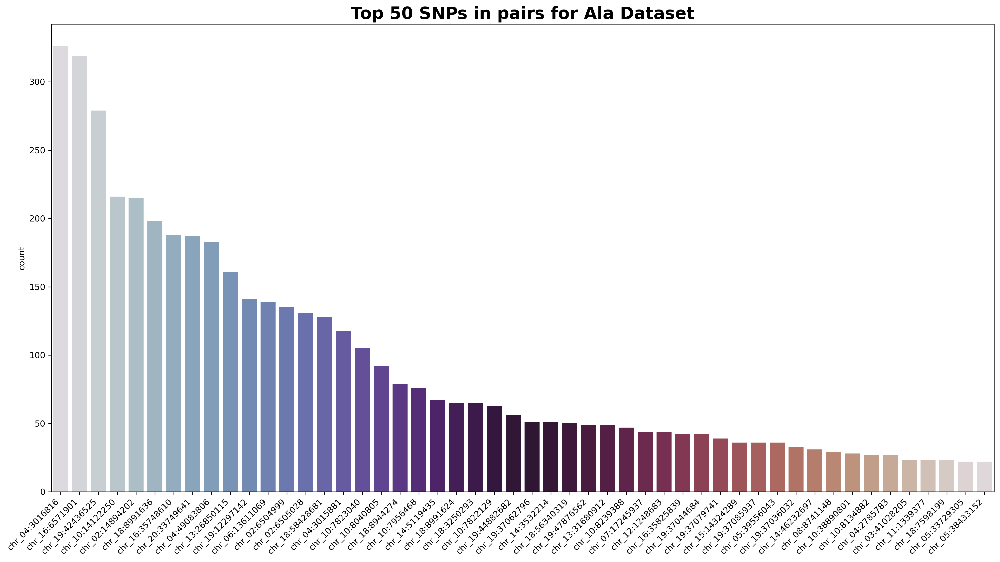

In [10]:
# combining all SNPs from pairs
snps = pd.concat([ala_pairs["SNP1"], ala_pairs["SNP2"]], axis=0)

# visualization of the most abundant SNPs using countplot
fig, ax = plt.subplots(figsize=(20,10), dpi=300)
sns.countplot(x=snps, order=snps.value_counts()[:50].index, palette="twilight", ax=ax)
ax.set_xticklabels(snps.value_counts()[:50].index, rotation=45, ha="right")
ax.set_title("Top 50 SNPs in pairs for Ala Dataset", fontsize=20, fontweight="bold");

As the result of `MIDESP`, we obtained **123** SNPs significantly associated with phenotype. Also `MIDESP` returned **5070** SNP pairs (top 0.25% of all possible pairs) with epistatic interactions that associated with **Ala phenotype**. For more information *MIDESP-significant* SNPs and pairs, see [the authors article](https://www.mdpi.com/2079-7737/10/9/921).

For the interpretation of the interactions, we mapped the SNPs to their corresponding genes using `bedtools intersect` with respective genome annotation.

### SNP Annotation

#### Remapping on [Genome assembly v2.1](https://www.ncbi.nlm.nih.gov/assembly/GCF_000004515.5)

To annotate SNPs, we need to remap them on *Glycine max* genome assembly **v2.1** due to the absense of annotation for genome assembly v1.1. We have used [NCBI Genome Remapping Service](https://www.ncbi.nlm.nih.gov/genome/tools/remap/JSID_01_570356_130.14.24.130_9034_remap__1683569324) web tool for Assembly-Assembly remapping. For this purpose, we extracted all unique SNPs from pairs and expand their location by +-500bp. As the result, we we generated file with genome ranges in **chrN:start-stop format** for each SNP.

In [11]:
# extracting unique SNPs from pairs
snps_unique = snps.unique()
print(f"{len(snps_unique)} SNPs comprise all found pairs")

2167 SNPs comprise all found pairs


In [12]:
# path for saving 1kb regions
coord_path = "../alanine_dataset/ala_midesp_analysis/ala_SNPs_coordinates"
snps_unique_df = generate_1kb_regions(dataframe=ala_pairs, coord_file=coord_path)
snps_unique_df.head()

,SNP_ID,chr,position,position-500,position+500,coordinate
0,chr_03:40580920,chr3,40580920,40580420,40581420,chr3:40580420-40581420
1,chr_04:3016816,chr4,3016816,3016316,3017316,chr4:3016316-3017316
2,chr_19:37044684,chr19,37044684,37044184,37045184,chr19:37044184-37045184
3,chr_19:37036032,chr19,37036032,37035532,37036532,chr19:37035532-37036532
4,chr_04:2791918,chr4,2791918,2791418,2792418,chr4:2791418-2792418


We decided to perform feature remapping with [NCBI Feature remapping](https://www.ncbi.nlm.nih.gov/genome/tools/remap) web tool and following parameters:

| Parameter | Value |
|-----------|-------|
| **Genome information** | |
| Source Organism | Glycine max  |
| Source Assembly | V1.1 |
| Target Assembly | Glycine_max_v2.1 |
| **Remapping Options** | |
| Minimum ratio of bases that must be remapped:     | 0.5 |
| Maximum ratio for difference between source length and target length: | 2 |
| Allow multiple locations to be returned:  | yes |
| Merge Fragments: | no |
| **Data** | |
| Input format: | Best Guess |
| Output format: | Same as input | 

Then **Upload a file** or **Paste data**. The parameters were default, exept Assemblies and "Merge Fragments". We used genome assembly v2.1 because for this assembly there was a quite good annotation. Also, at the time of the analysis it was the latest reviewed assembly and this annotation was in representative genome RefSeq category.

After [NCBI Feature remapping](https://www.ncbi.nlm.nih.gov/genome/tools/remap) information from V1.1 ([GCF_000004515.3](https://www.ncbi.nlm.nih.gov/assembly/GCF_000004515.3/)) to Glycine_max_v2.1 ([GCF_000004515.4](https://www.ncbi.nlm.nih.gov/assembly/GCF_000004515.5/)), we removed unmapped SNP regions for further analysis. This mean that the tool could not find defined regions from v1.1 in v2.1 genome assembly.


As the result of remapping, we have obtained **2189** coordinates. It turned out that the number of coordinates has increased. After the analysis, we found out that some SNPs were not mapped to genomic assembly v2.1, and those that were remapped more than once were also present. It is interesting that in this case, two coordinates were returned for the SNP, differing in name format for the chromosome (both chrN name and its respective RefSeq ID were present) and sometimes with locus IDs.

In [13]:
# reading the results of remapping
remapped_coords = pd.read_csv("../alanine_dataset/ala_midesp_analysis/remapped_ala_SNPs_coordinates.xls", 
                              usecols=[
                                  "source_id", "source_start", "mapped_id", "mapped_start", 
                                  "mapped_stop", "mapped_length"
                              ], sep="\t")

Also, we need to restore initial SNP IDs from coordinates.

In [14]:
# list with chromosomes in format from MIDESP output
chrom_ = [f"chr_0{i}" if i < 10 else f"chr_{i}" for i in range(1, 21)]

# list with chromosomes in format for remapping
chrom_num = [f"chr{i}" for i in range(1, 21)]

# dictionary with chromosomes for renaming
chrom = dict(zip(chrom_, chrom_num))

# to back to initial SNP IDs
remapped_coords.loc[:, "source_id"] = remapped_coords["source_id"].apply(
    lambda x: [key for key, val in chrom.items() if x == val][0])
remapped_coords.loc[:, "SNP_IDs"] = remapped_coords["source_id"].str.cat(
    remapped_coords["source_start"].apply(lambda x: str(x + 500)), sep=":"
)

# dropping columns with initial chr and position
remapped_coords.drop(columns=["source_id", "source_start"], inplace=True)

We noticed, that there are **14** coordinates with gene IDs for the chromosomes or other IDs. Due to the variant which were mapped in such regions also were remapped on chromosomes in standard chrN format, we decided to remove them from further analysis. This regions could not be intersected with genome annotation.

In [15]:
# examples of strangely remapped coordinates
remapped_coords[~remapped_coords["mapped_id"].isin(chrom.values())].head()

,mapped_id,mapped_length,mapped_start,mapped_stop,SNP_IDs
99,NW_020446086.1,1001.0,46020.0,47020.0,chr_11:37793863
202,NW_020446025.1,1001.0,3314938.0,3315938.0,chr_11:11559344
220,NW_020446035.1,1001.0,259747.0,260747.0,chr_11:11295368
233,NaN,NaN,NaN,NaN,chr_01:16716275
271,NW_020446341.1,906.0,2987.0,3892.0,chr_15:19620074


In [16]:
# dropping strangely remapped coordinates 
remapped_coords.drop(remapped_coords[~remapped_coords["mapped_id"].isin(chrom.values())].index, inplace=True)

# dropping unmapped regions
remapped_coords = remapped_coords.drop(index=remapped_coords[remapped_coords["mapped_id"].isna()].index, axis=0).reset_index(drop=True)

# sorting dataframe by "mapped_length"
remapped_coords = remapped_coords.sort_values(by="mapped_length", ascending=False)

# dropping rows with duplicated SNP IDs and less "mapped_length"
remapped_coords = remapped_coords.drop_duplicates(subset="SNP_IDs", keep="first").reset_index(drop=True)
remapped_coords.head()

,mapped_id,mapped_length,mapped_start,mapped_stop,SNP_IDs
0,chr3,1001.0,38566170.0,38567170.0,chr_03:40580920
1,chr3,1001.0,5817904.0,5818904.0,chr_03:5858874
2,chr15,1001.0,37104246.0,37105246.0,chr_15:34521184
3,chr3,1001.0,31967779.0,31968779.0,chr_03:34004410
4,chr1,1001.0,38559447.0,38560447.0,chr_01:37185602


In [17]:
remapped_coords.shape

(2132, 5)

After remapping, **2132** SNPs were remained.

#### Intersection with Annotation for genome assembly v2.1

We need to annotate SNP pairs resulted from `MIDESP` tool. For this purpose, we replaced chromosome names with those from annotation for [genome assembly v2.1](https://www.ncbi.nlm.nih.gov/assembly/GCF_000004515.5). The chromosome in this annotation are presented as RefSeq IDs (start with NC_).

We generated `.bed` files to run `bedtools intersect`.

**Columns:**

1) **refseq_chr** - chromosome RefSeq IDs;
2) **mapped_start** - remapped start coordinate;
3) **mapped_stop** - remapped stop coordinate;
4) **SNP_ID** - initial SNP IDs

In [18]:
# path for .bed file
bed_path = "../alanine_dataset/ala_midesp_analysis/ala_remapped_SNPs"

# generating .bed file for SNP annotation
remapped_coords = generate_bed_file_aa(dataframe=remapped_coords, bed_path=bed_path)

In [19]:
# this dataframe was written in .bed file
remapped_coords.head()

,mapped_id,mapped_length,mapped_start,mapped_stop,SNP_IDs,chr_ID
0,chr3,1001.0,38566169,38567169,chr_03:40580920,NC_016090.3
1,chr3,1001.0,5817903,5818903,chr_03:5858874,NC_016090.3
2,chr15,1001.0,37104245,37105245,chr_15:34521184,NC_038251.1
3,chr3,1001.0,31967778,31968778,chr_03:34004410,NC_016090.3
4,chr1,1001.0,38559446,38560446,chr_01:37185602,NC_016088.3


We have run `bedtools intersect` with the following command (annotation file could be found [here](../../annotations/GCF_000004515.5_Glycine_max_v2.1_genomic.gff.gz)):

```
bedtools intersect -wao -a ../alanine_dataset/ala_midesp_analysis/ala_remapped_SNPs.bed -b GCF_000004515.5_Glycine_max_v2.1_genomic.gff > ../alanine_dataset/ala_midesp_analysis/ala_intersection.txt
```

#### Parsing features and filtering genes

After intersection with annotation file, we parsed resulted features and filtered genes.

In [20]:
# reading intersection file
# we only interested in columns with "SNP_ID", "chr", "type", "start", "stop", "features", "intersection_length"
ala_inter = pd.read_csv("../alanine_dataset/ala_midesp_analysis/ala_intersection.txt", sep="\t", 
                        usecols=[3, 4, 6, 7, 8, 12, 13], header=None, 
                        names=["SNP_ID", "chr", "type", "start", "stop", "features", "intersection_length"])

# filtering features with type "gene"
ala_inter_genes = ala_inter[ala_inter["type"] == "gene"].reset_index(drop=True)
ala_inter_genes.head()

,SNP_ID,chr,type,start,stop,features,intersection_length
0,chr_03:40580920,NC_016090.3,gene,38565402,38567704,ID=gene-LOC100799357;Dbxref=GeneID:100799357;N...,1000
1,chr_03:5858874,NC_016090.3,gene,5815288,5822172,ID=gene-LOC100813244;Dbxref=GeneID:100813244;N...,1000
2,chr_01:37185602,NC_016088.3,gene,38559931,38588129,ID=gene-LOC102667909;Dbxref=GeneID:102667909;N...,516
3,chr_09:31345032,NC_038245.1,gene,33970063,33987689,ID=gene-LOC100777892;Dbxref=GeneID:100777892;N...,1000
4,chr_04:5378224,NC_016091.3,gene,5440890,5449850,ID=gene-LOC100780104;Dbxref=GeneID:100780104;N...,1000


It is known that the genome annotation may contain more than one entry about a genomic region (for example, some genes may overlap, or a gene may be annotated by different algorithms). Therefore, we checked whether there are duplicates in our case.

In [21]:
# checking duplicated SNP IDs
ala_inter_genes[ala_inter_genes["SNP_ID"].duplicated(keep=False)]

,SNP_ID,chr,type,start,stop,features,intersection_length
19,chr_19:49900465,NC_038255.1,gene,50021303,50024139,ID=gene-LOC100793748;Dbxref=GeneID:100793748;N...,824
20,chr_19:49900465,NC_038255.1,gene,50019487,50021473,ID=gene-LOC102669597;Dbxref=GeneID:102669597;N...,347
46,chr_20:28235050,NC_038256.1,gene,29399891,29413506,ID=gene-LOC100811464;Dbxref=GeneID:100811464;N...,1000
47,chr_20:28235050,NC_038256.1,gene,29406616,29410229,ID=gene-LOC102662820;Dbxref=GeneID:102662820;N...,1000
59,chr_07:36704280,NC_038243.1,gene,36595661,36599824,ID=gene-LOC100812414;Dbxref=GeneID:100812414;N...,1000
...,...,...,...,...,...,...,...
1332,chr_10:37804635,NC_038246.1,gene,38329467,38331415,ID=gene-LOC100805000;Dbxref=GeneID:100805000;N...,99
1334,chr_07:17476923,NC_038243.1,gene,17561077,17562312,ID=gene-LOC102664401;Dbxref=GeneID:102664401;N...,456
1335,chr_07:17476923,NC_038243.1,gene,17562808,17563233,ID=gene-LOC102664536;Dbxref=GeneID:102664536;N...,49
1357,chr_14:4609984,NC_038250.1,gene,4692965,4694511,ID=gene-LOC106795990;Dbxref=GeneID:106795990;N...,761


Yes, *some SNP IDs* were duplicated. We sorted regions by *intersection length* and dropped with the shortest overlap.

In [22]:
# sorting by "intersection_length"
ala_inter_genes = ala_inter_genes.sort_values(by="intersection_length", ascending=False)

# dropping duplicated "SNP_IDs" with the shortest overlap
ala_inter_genes = ala_inter_genes.drop_duplicates(subset="SNP_ID", keep="first").reset_index(drop=True)

The "features" column contains a lot of information. The most valuable for our analysis is "gene ID". We parsed "features" in the following way.

In [23]:
# parsing column "features" to obtain gene attibutes (especially gene IDs) and
# combining genes with respective SNPs
ala_features = pd.concat([ala_inter_genes["SNP_ID"], parse_features(ala_inter_genes["features"])], axis=1)

# saving gene features to file for any future purpose
ala_features.to_csv("../alanine_dataset/ala_midesp_analysis/ala_features_for_snps.txt", sep="\t", index=False)

We have **1347 genes** after SNP annotation, gene filtering, and dropping duplicated ones.

### Preparation for building gene-gene interactions network

For building a Graph with gene-gene interactions, we replaced SNP IDs in MIDESP output with SNP pairs by GeneIDs. Not all of the SNPs from pairs belong to gene regions. Pairs with such SNPs were dropped. As expected, we obtained 1347 pairs.

In [24]:
# dictionary with SNP IDs and respective genes
snp_gene_dict = dict(zip(ala_features["SNP_ID"], ala_features["gene"]))
print(f"Number of SNP-gene pairs: {len(snp_gene_dict)}")

Number of SNP-gene pairs: 1347


In [25]:
# copying initial dataframe with SNP pairs
ala_gene_pairs = ala_pairs[["SNP1", "SNP2", "MI_APC"]]

ala_gene_pairs = assign_gene_for_snp(dataframe=ala_gene_pairs, n_snps=2, snp_gene_dict=snp_gene_dict)

As mentioned in [Whang et al., 2017](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5461529/), to expand the analysis scope from SNPs to genes and enable better interpretation and functional validation in a network framework, we convert the constructed SNP epistasis networks into gene-gene interaction networks. Edge weights of the gene-gene interaction network are computed using the edge weights ($MI_APC$) of SNP epistasis network. As multiple SNPs can be mapped to the same gene, we need an algorithm to determine the weight between two genes given the mapped SNPs and the association strengths between them. Given multiple edge weights between SNPs belonging to two different genes, we used choose **maximum $MI_{APC}$** value as the weight in a gene network.

We checked if there are any mirrored SNP pairs and dropped one of them due to they are equal. For example, $(1, 2) = (2, 1)$. Also, we checked if any genes were paired with themselves. 

Also, we visualized $MI_{APC}$ distribution.

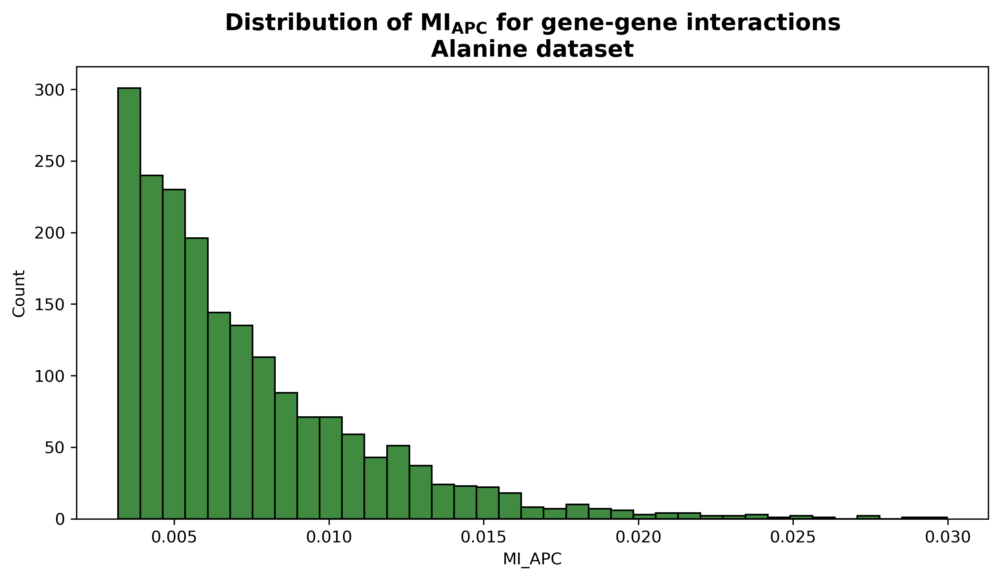

In [26]:
# MI-APC distribution for Alanine content dataset
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

sns.histplot(ala_gene_pairs["MI_APC"], ax=ax, color="darkgreen")
ax.set_title("Distribution of $\mathbf{MI_{APC}}$ for gene-gene interactions\nAlanine dataset", fontsize=14, fontweight="bold")
plt.savefig("../Pictures/MI_distr_ala.png", format="png", bbox_inches="tight");

### GO and KEGG Enrichment analysis


Further, we used [ShinyGO 0.77](http://bioinformatics.sdstate.edu/go/) web tool to performe GO and KEGG annotation all found genes. Fistly, we built gene-gene interaction network, genes are nodes in this network. It is known that Gene IDs for uncharechterized genes starts with *"LOC"*. But some web tools do not recognise them. For further analysis, we removed "LOC" from Gene IDs and wrote them to file.

In [27]:
# graph with all interacting genes generated form ala_gene_pairs dataframe
G = nx.from_pandas_edgelist(ala_gene_pairs, source="gene1", target="gene2", edge_attr="MI_APC")

all_nodes = [i[3:] if i.startswith("LOC") else i for i in G.nodes]
with open("../alanine_dataset/ala_midesp_analysis/midesp_ala_all_genes.txt", "w") as file:
    [file.write(str(i)+"\n") for i in all_nodes]

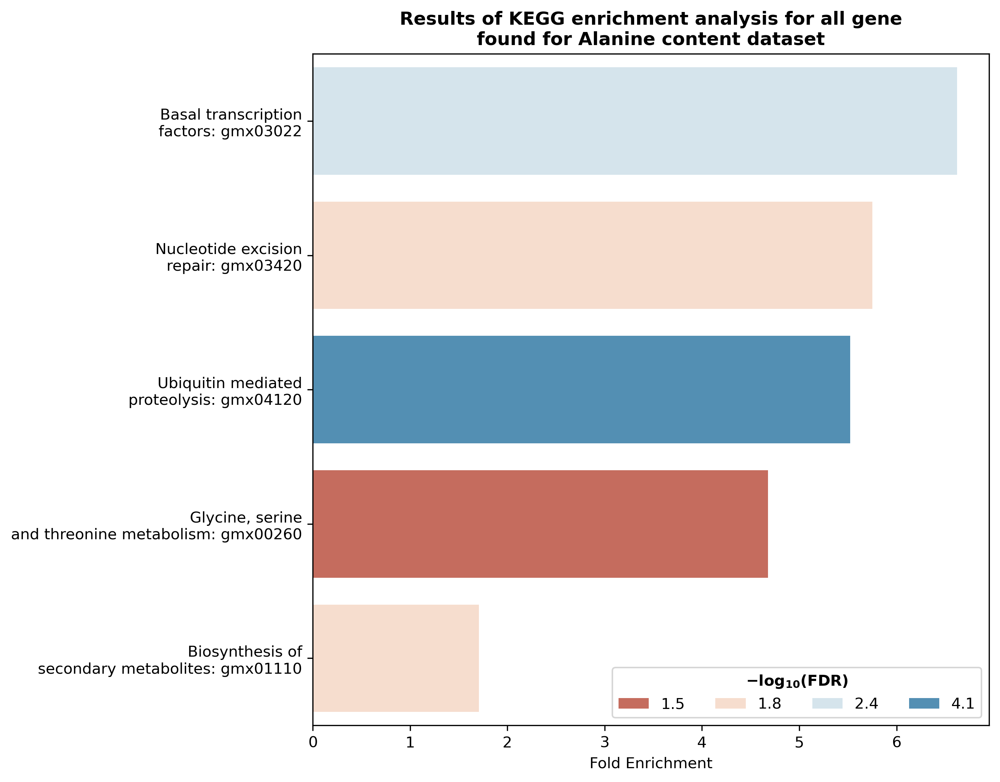

In [28]:
# reading the results for KEGG enrichment analysis
kegg = pd.read_csv("../alanine_dataset/ala_midesp_analysis/ala_enrichment.csv")

# parsing file with KEGG enrichment results
kegg = parse_kegg_results(kegg_dataframe=kegg, dataset_name="Alanine content dataset")
plt.savefig("../Pictures/ala_KEGG.png", format="png", bbox_inches="tight");

### Building Graph with gene-gene interactions

Firstly, we have built the Graph with all gene-gene interactions. It takes a while.

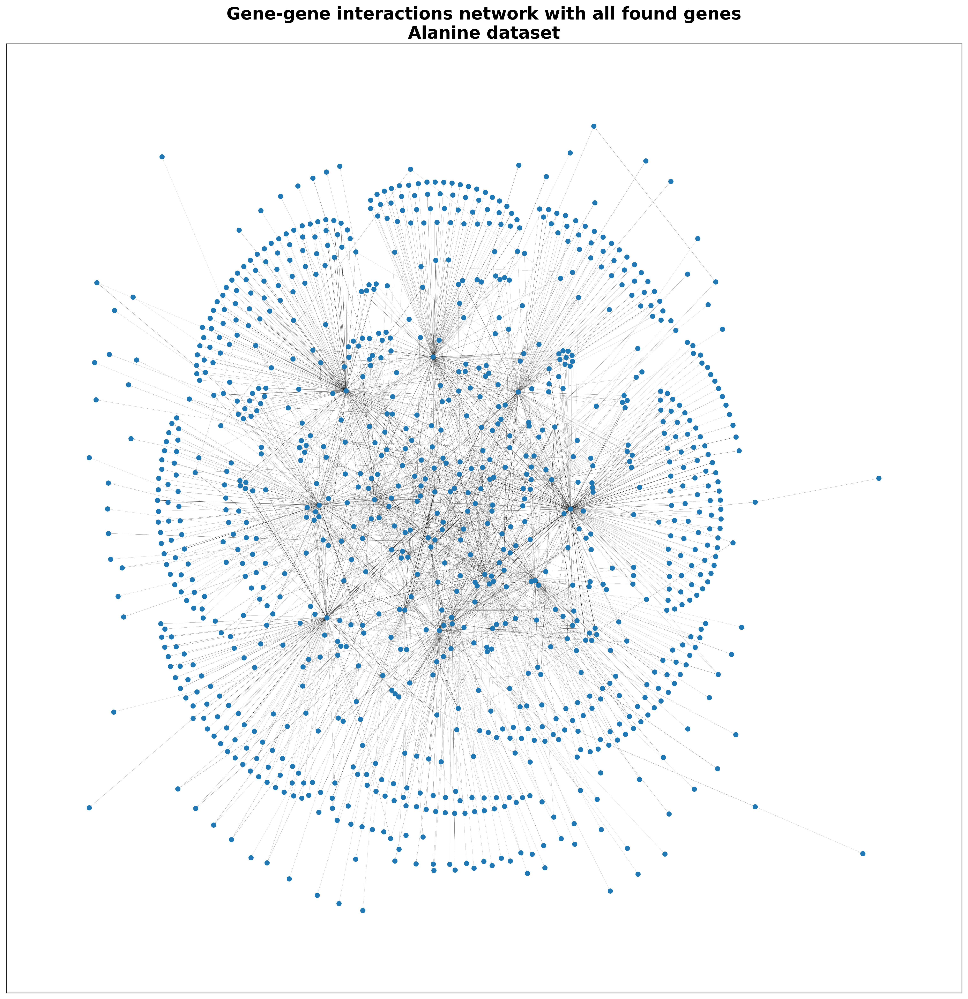

In [29]:
title = "Gene-gene interactions network with all found genes\nAlanine dataset"

# list with MI_APC for edges attributes
mi = [i["MI_APC"]*10 for i in dict(G.edges).values()]

pos = nx.kamada_kawai_layout
plot_graph(graph=G, title=title, edge_attr=mi, pos=pos, labels=None)
plt.savefig("../Pictures/ala_net_all.png", format="png", bbox_inches="tight");

As recommended by authors, we have prepared subgraph by filtering nodes using **z-normalization** of **node degrees**, or the **$MI_{APC}$ $\ge 3$**.

#### 1. Gene-gene interactions graph using **z-normalization** of **node degrees**

We have extracted **node degrees** from the initial graph, normalized them using **z-normalization**, and built subgraph using nodes with $z-scores \ge 3$. Also, we have found top 10 nodes by normalized *degree* in resulted subgraph with the highest degrees and named them by gene names. It is known that Gene IDs for uncharechterized genes starts with "LOC". But some web tools do not recognise them. For further analysis, we removed "LOC" from Gene IDs and wrote them into file.

In [30]:
# filtering graph by z-score of node degrees
filt_degrees_df, filtered_G = filter_graph_by_degree(graph=G, return_filt_graph=True)

# removing "LOC" from Gene IDs
top_nodes = [i[3:] if i.startswith("LOC") else i for i in filt_degrees_df["nodes"][:10]]

# writing Gene IDs to file
with open("../alanine_dataset/ala_midesp_analysis/top10_nodes_by_z_degree.txt", "w") as file:
    [file.write(str(i)+"\n") for i in top_nodes]

Then, we manually found names for these genes in [NCBI](https://www.ncbi.nlm.nih.gov/gene/) Database to display on gene-gene interaction network.

In [32]:
# reading file with top gene names
filt_degrees_df = pd.read_csv("../alanine_dataset/ala_midesp_analysis/top10_nodes_by_z_degree_names.txt", sep=",",
                              names=["nodes", "gene_names"], header=None)
filt_degrees_df.loc[:, "nodes"] = filt_degrees_df["nodes"].apply(lambda x: "LOC"+str(x))

# dictionary with nodes and respective gene names
top_labels_degrees = dict(zip(filt_degrees_df["nodes"], filt_degrees_df["gene_names"]))

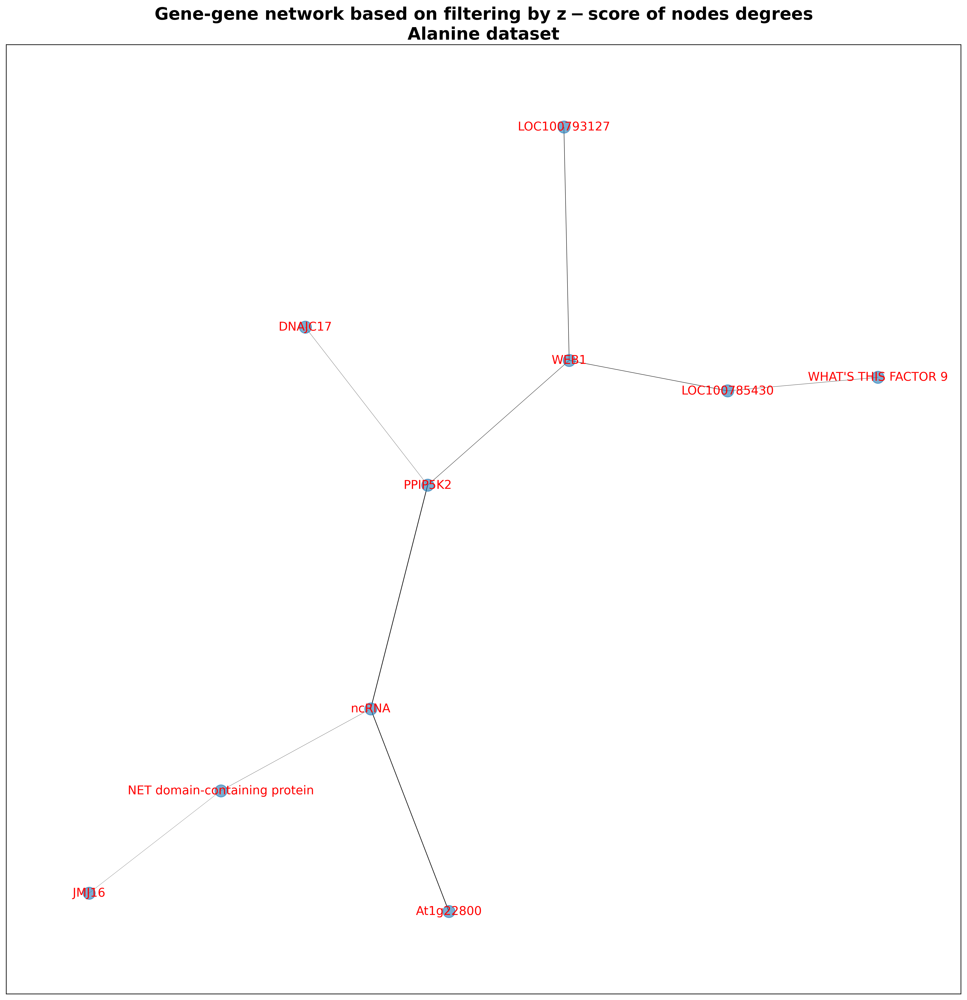

In [33]:
# plotting gene-gene network based on filtering by z-score of nodes degrees
title = "Gene-gene network based on filtering by $\mathbf{z-score}$ of nodes degrees\nAlanine dataset"

# list with MI_APC for edges attributes
mi = [i['MI_APC']*50 for i in dict(filtered_G.edges).values()]
pos = nx.kamada_kawai_layout
plot_graph(graph=filtered_G, title=title, edge_attr=mi, pos=pos, labels=top_labels_degrees)

#### 2. Gene-gene interactions graph using **z-normalization** of $\mathbf{MI_{APC}}$ between gene pairs

We have normalized $\mathbf{MI_{APC}}$ scores between pairs and built Graph using edges with $z-scores \ge 3$

In [34]:
# filtering dataframe by z-score MI_APC and finding top 10 gene pairs by these score
filt_MI_df, top_pairs = filter_graph_by_MIAPC(ala_gene_pairs)

In [35]:
# writing SNP and gene pairs for building final network
filt_MI_df.to_csv("../alanine_dataset/ala_midesp_analysis/midesp_ala_nodes_z_MI.csv",
                  columns=["SNP1", "SNP2", "MI_APC", "z_scores", "gene1", "gene2"], index=False)

In [36]:
# writing all SNP and gene pairs to file
ala_gene_pairs.to_csv("../alanine_dataset/ala_midesp_analysis/midesp_ala_snps_genes_pairs.csv",
                      columns=["SNP1", "SNP2", "MI_APC", "z_scores", "gene1", "gene2"], index=False)

Also, we have found top 10 gene pairs by normalized $MI_{APC}$ and named them by gene names. It is known that Gene IDs for uncharechterized genes starts with "LOC". But some web tools do not recognise them. For further analysis, we removed "LOC" from Gene IDs and wrote them into file.

In [37]:
# removing "LOC" from Gene IDs
genes_MI = [i[3:] if i.startswith("LOC") else i for i in top_pairs]
with open("../alanine_dataset/ala_midesp_analysis/top10_genes_by_MI.txt", "w") as file:
    [file.write(str(i)+"\n") for i in genes_MI]

Then, we manually found names for genes in [NCBI](https://www.ncbi.nlm.nih.gov/gene/) Database.

In [38]:
# reading file with top 10 gene pairs names
top_gene_names = pd.read_csv("../alanine_dataset/ala_midesp_analysis/top10_genes_by_MI_names.txt", sep=r",",
                            names=["top_nodes", "names"])
top_gene_names["top_nodes"] = top_gene_names["top_nodes"].apply(lambda x: "LOC"+str(x))

# dictionary with nodes and respective gene names
top_labels = dict(zip(top_gene_names["top_nodes"], top_gene_names["names"]))

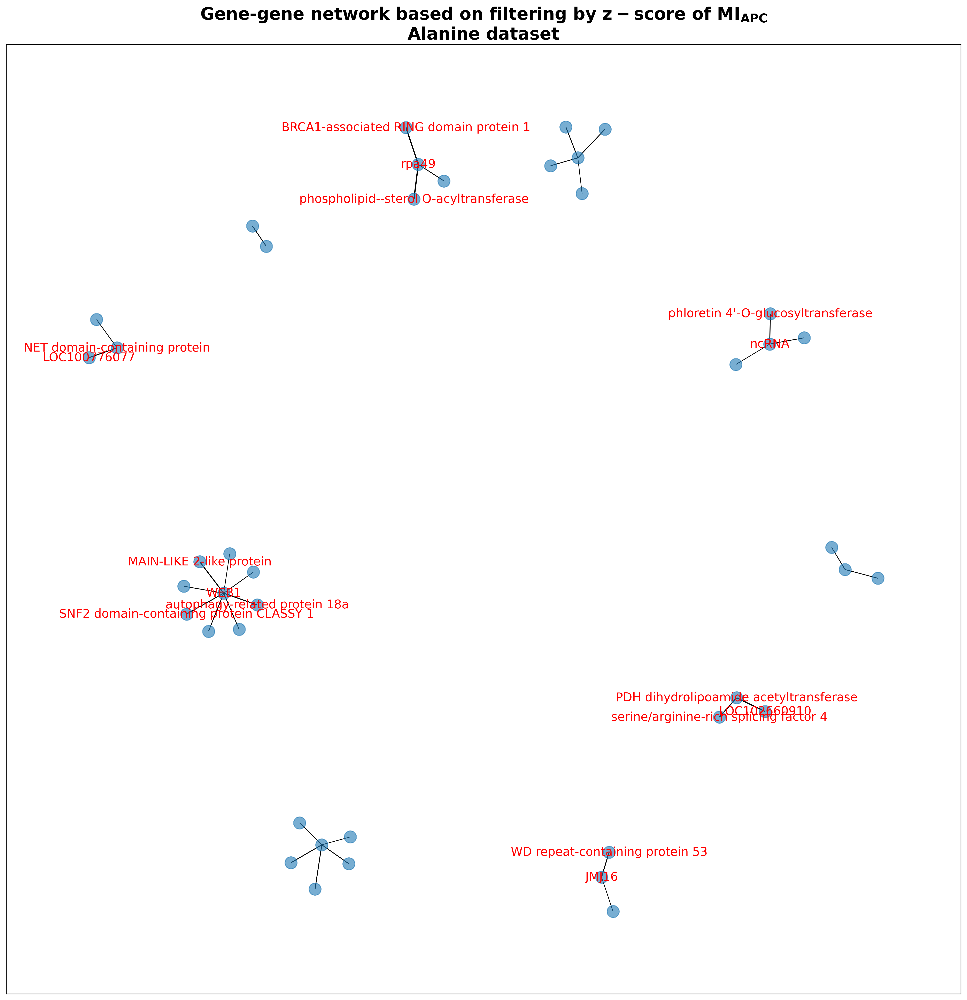

In [39]:
# building gene-gene network based on z-score of MI-APC
MI_G = nx.from_pandas_edgelist(filt_MI_df, source="gene1", target="gene2", edge_attr="z_scores")

# plotting gene-gene network based on filtering by z-score MI_APC
title = "Gene-gene network based on filtering by $\mathbf{z-score}$ of $\mathbf{MI_{APC}}$\nAlanine dataset"

# list with MI_APC for edges attributes
mi = [i['z_scores']/4 for i in dict(MI_G.edges).values()]
pos = nx.spring_layout
plot_graph(graph=MI_G, title=title, edge_attr=mi, pos=pos, labels=top_labels)

### GO IDs of biological processes for genes pairs

We also defined the GO IDs of biological processes for genes using [db2db](https://biodbnet.abcc.ncifcrf.gov/db/db2db.php) to display them on the network. We used them for fancy graph representation.

In [40]:
# reading output with GO IDs for top 10 gene pairs
go_ids = pd.read_csv("../alanine_dataset/ala_midesp_analysis/GO_for_nodes_MI.txt", sep="\t", usecols=[0, 1])

# parsing IDs
go_ids = parse_gene_info(go_ids, "GO - Biological Process")

# restoring gene names as in graph
go_ids.loc[:, "Gene ID"] = go_ids["Gene ID"].apply(lambda x: "LOC"+str(x))